### I had deployed the Application in heroku : https://detectfire.herokuapp.com/predict

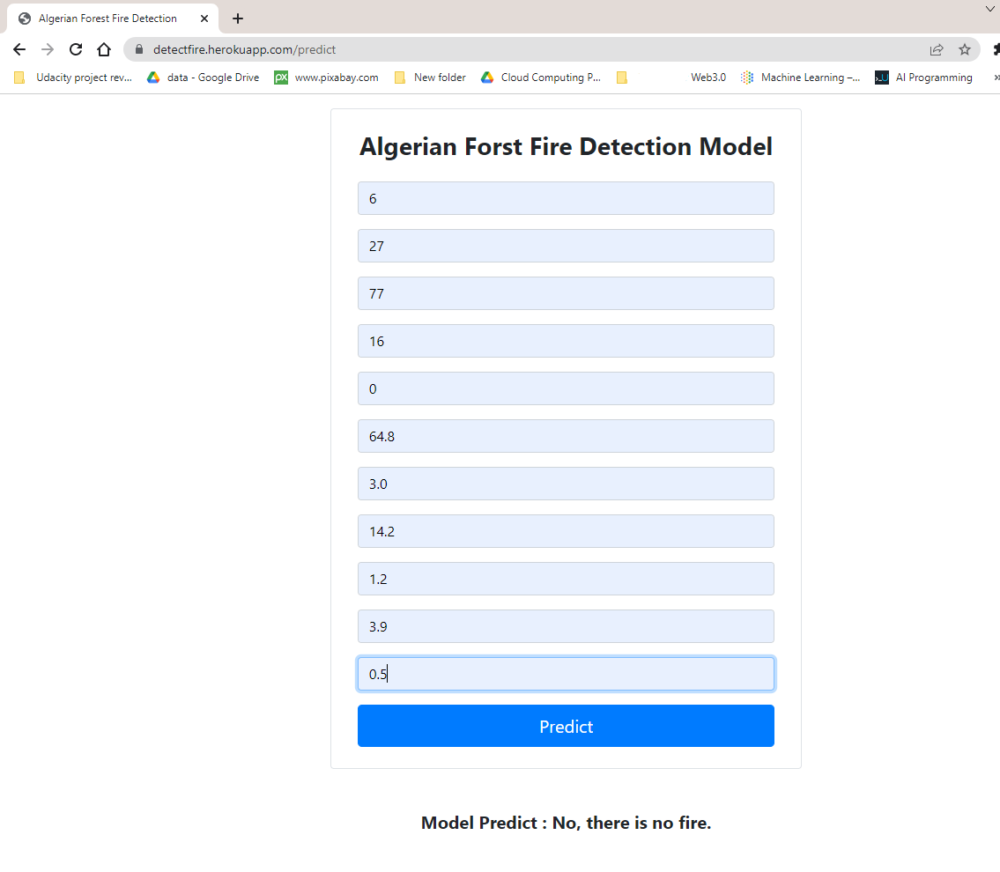 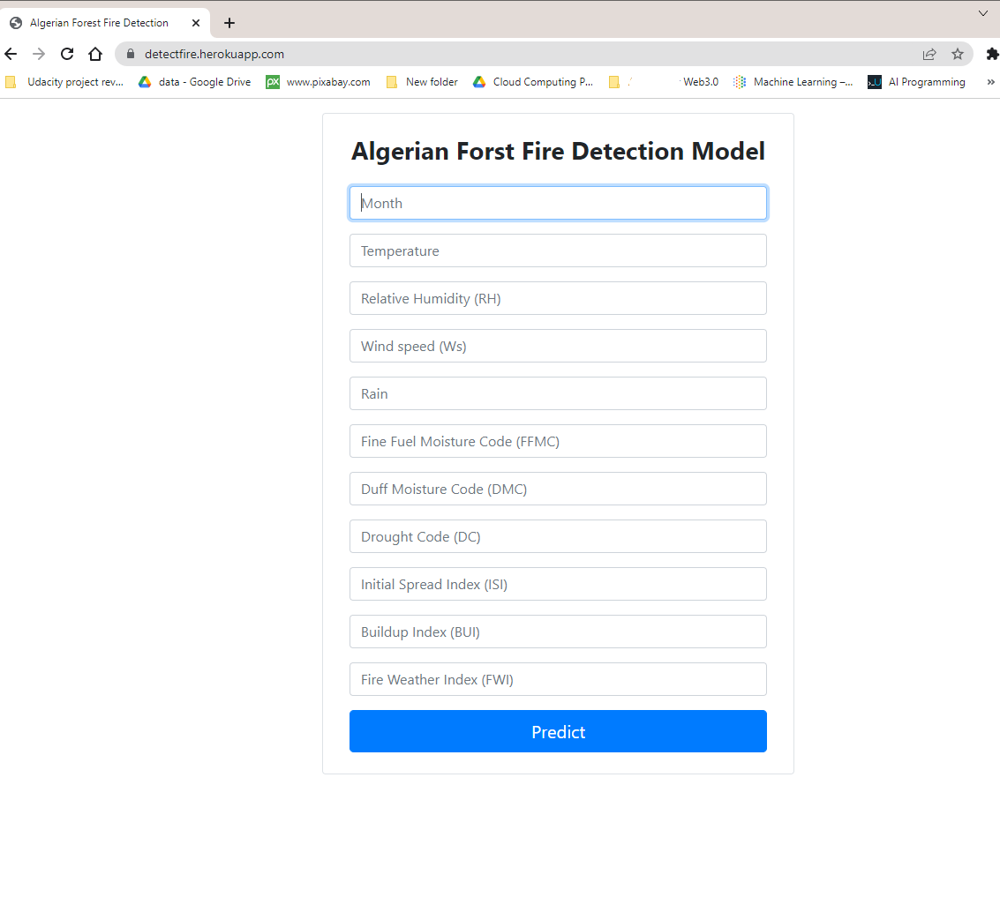

# 1. Business Understanding

### Data Set Information:

* The dataset includes 244 instances that regroup a data of two regions of Algeria,namely the Bejaia region located in the northeast of Algeria and the Sidi Bel-abbes region located in the northwest of Algeria.

* 122 instances for each region.

* The period from June 2012 to September 2012.
* The dataset includes 11 attribues and 1 output attribue (class)
* The 244 instances have been classified into â€˜fireâ€™ (138 classes) and â€˜not fireâ€™ (106 classes) classes.


#### Attribute Information:

1. **Date** : (DD/MM/YYYY) Day, month ('june' to 'september'), year (2012)
Weather data observations
2. **Temp** : temperature noon (temperature max) in Celsius degrees: 22 to 42
3. **RH** : Relative Humidity in %: 21 to 90
4. **Ws** :Wind speed in km/h: 6 to 29
5. **Rain**: total day in mm: 0 to 16.8
FWI Components
6. **Fine Fuel Moisture Code (FFMC) index from the FWI system**: 28.6 to 92.5
7. **Duff Moisture Code (DMC) index from the FWI system**: 1.1 to 65.9
8. **Drought Code (DC) index from the FWI system**: 7 to 220.4
9. **Initial Spread Index (ISI) index from the FWI system**: 0 to 18.5
10. **Buildup Index (BUI) index from the FWI system**: 1.1 to 68
11. **Fire Weather Index (FWI) Index**: 0 to 31.1

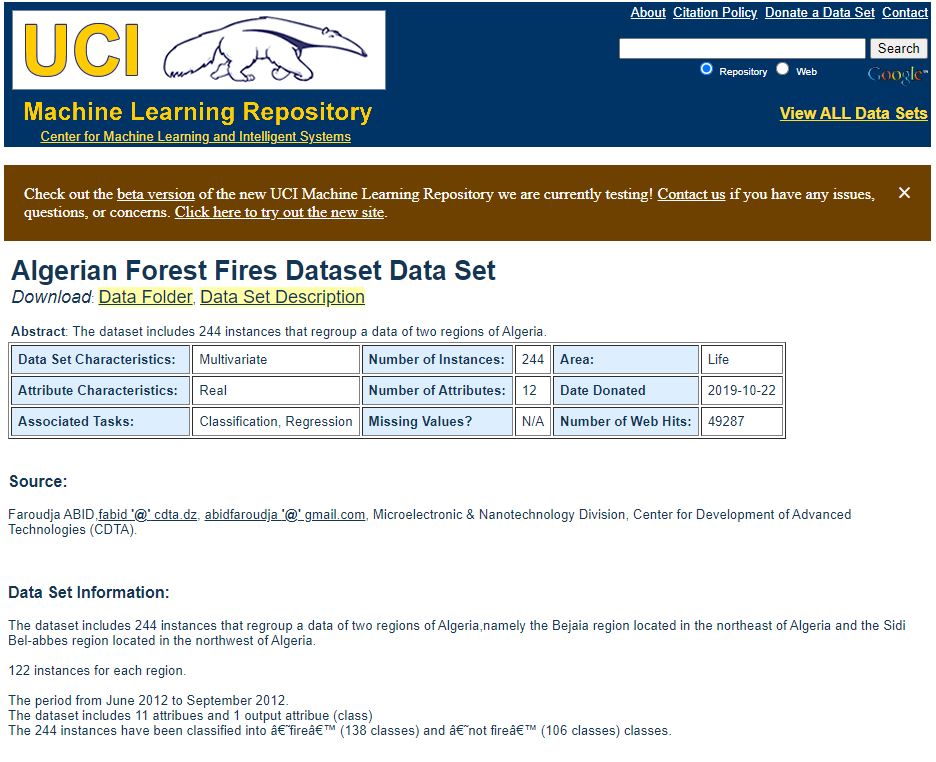

### **Step 1: Importing Libraries and loading the Dataset**

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly
import pandas_profiling
import cufflinks as cf
%matplotlib inline

from sklearn import preprocessing
from sklearn.preprocessing import Normalizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV

### **Step 2: Reading the Algerian Forest Fire Dataset (or) Bejaia Region Dataset (.csv file format)**

In [2]:
# I had downloaded the file locally but for better reach of dataset I had readng it through the link
# df = pd.read_csv('Algerian_forest_fires_dataset_UPDATE.csv', skiprows=1) # skiprows is used to skipping the 1st row 

df = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/00547/Algerian_forest_fires_dataset_UPDATE.csv', skiprows=1) # skiprows is used to skipping the 1st row 

Here Dataset has unuseful info before the real columns (Info: Bejaia Region Dataset) 
I skipped that row

Initially, Dataset will be like this :

We have to skip the 1st row so the real column can be shown as header part

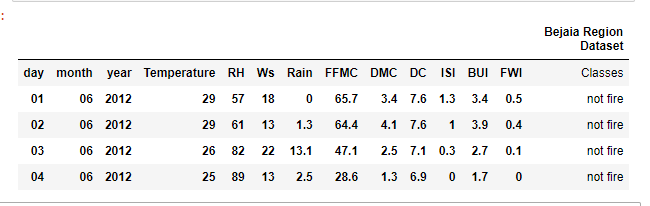

### Observation : 

1. From Problem statement we can get the insight about dataset that it have 244 instances and having 12 features (except the target variable 'Classes' and indexing column of dataset).


2. Dataset is comprises of two dataset of different region of Algeria and also "year" column is constant for all the categories or is the un-useful column.


3. After loading the dataset we can see the dataset heading is above the column names so, we have to skip that one.

# 2. Data Understanding (or) Data Exploration

In [3]:
#Q. What are top - 5 data-points ?
df.head(130)

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
0,01,06,2012,29,57,18,0,65.7,3.4,7.6,1.3,3.4,0.5,not fire
1,02,06,2012,29,61,13,1.3,64.4,4.1,7.6,1,3.9,0.4,not fire
2,03,06,2012,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,not fire
3,04,06,2012,25,89,13,2.5,28.6,1.3,6.9,0,1.7,0,not fire
4,05,06,2012,27,77,16,0,64.8,3,14.2,1.2,3.9,0.5,not fire
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,02,06,2012,30,73,13,4,55.7,2.7,7.8,0.6,2.9,0.2,not fire
126,03,06,2012,29,80,14,2,48.7,2.2,7.6,0.3,2.6,0.1,not fire
127,04,06,2012,30,64,14,0,79.4,5.2,15.4,2.2,5.6,1,not fire
128,05,06,2012,32,60,14,0.2,77.1,6,17.6,1.8,6.5,0.9,not fire


In [4]:
#Q. How many Data-points and features are there ?
#A. There are 246 data-points / rows and 14 features / columns
print(df.shape)

(246, 14)


In [5]:
#Q. What are the column names in our dataset?
#A. ('day', 'month', 'year', 'Temperature', ' RH', ' Ws', 'Rain ', 'FFMC','DMC', 'DC', 'ISI', 'BUI', 'FWI', 'Classes' are column names.
print(df.columns) # we can also use # df.keys()

Index(['day', 'month', 'year', 'Temperature', ' RH', ' Ws', 'Rain ', 'FFMC',
       'DMC', 'DC', 'ISI', 'BUI', 'FWI', 'Classes  '],
      dtype='object')


### Observation :

1. From Dataset Description we know Dataset have 244 instances/rows/Datapoints but df.shape is showing 246 instances/rows/Datapoints so, 2 instance or rows are extra or are un-useful we have to drop them it won't affect the dataset.


2. It also shows 14 features/columns where we can see one column having DD/MM/YYYY is divide into three different different columns


3. We can see the white spaces in many columns such as, "RH", "Ws", "Rain" and "Classes" etc now let's remove them first.

## Removing White Space from each column

In [6]:
# Q. How will I remove the extra spaces from feature
#A. Usig strip(), we can remove the extra spaces from each feature 
df.columns = df.columns.str.strip()

In [7]:
# Q. How many data-points for each class are present?
df['Classes'].value_counts()

fire             131
not fire         101
fire               4
fire               2
not fire           2
not fire           1
Classes            1
not fire           1
not fire           1
Name: Classes, dtype: int64

In [8]:
# Q. from above categories some of them look similar and one category named 'Classes' seems irrelavant to labels how I can handled them
# A. lets replaces the spaces with '_' (hyphene) symbol and then removes all '_' with '' (empty string)
#and drop the row of irrelavant label as it count only 1.
df.Classes = df.Classes.str.strip()
df['Classes'].value_counts()

fire        137
not fire    106
Classes       1
Name: Classes, dtype: int64

In [9]:
# Now replace the '_' with '' (empty string)
# df.Classes = df.Classes.str.strip()

In [10]:
# A, How many data-points for each class are present?
df['Classes'].value_counts()

fire        137
not fire    106
Classes       1
Name: Classes, dtype: int64

## Data Analysis steps:

1. Missing Values
2. All the numerical variable
3. Distribution of numerical Variables
4. Categorical variables
5. Outliers
6. Relationship b/w independent and dependent variables

In [11]:
df['Classes'].unique()

array(['not fire', 'fire', nan, 'Classes'], dtype=object)

#### 1.  Missing Value Analysis

In [12]:
df.isnull().sum()

day            0
month          1
year           1
Temperature    1
RH             1
Ws             1
Rain           1
FFMC           1
DMC            1
DC             1
ISI            1
BUI            1
FWI            1
Classes        2
dtype: int64

In [13]:
features_with_na=[features for features in df.columns if df[features].isnull().sum()]
for feature in features_with_na:
    print(feature, np.round(df[feature].isnull().mean(), 4), '% missing values.')

month 0.0041 % missing values.
year 0.0041 % missing values.
Temperature 0.0041 % missing values.
RH 0.0041 % missing values.
Ws 0.0041 % missing values.
Rain 0.0041 % missing values.
FFMC 0.0041 % missing values.
DMC 0.0041 % missing values.
DC 0.0041 % missing values.
ISI 0.0041 % missing values.
BUI 0.0041 % missing values.
FWI 0.0041 % missing values.
Classes 0.0081 % missing values.


In [14]:
df_plot=data=df.copy()

In [15]:
df_plot

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
0,01,06,2012,29,57,18,0,65.7,3.4,7.6,1.3,3.4,0.5,not fire
1,02,06,2012,29,61,13,1.3,64.4,4.1,7.6,1,3.9,0.4,not fire
2,03,06,2012,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,not fire
3,04,06,2012,25,89,13,2.5,28.6,1.3,6.9,0,1.7,0,not fire
4,05,06,2012,27,77,16,0,64.8,3,14.2,1.2,3.9,0.5,not fire
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
241,26,09,2012,30,65,14,0,85.4,16,44.5,4.5,16.9,6.5,fire
242,27,09,2012,28,87,15,4.4,41.1,6.5,8,0.1,6.2,0,not fire
243,28,09,2012,27,87,29,0.5,45.9,3.5,7.9,0.4,3.4,0.2,not fire
244,29,09,2012,24,54,18,0.1,79.7,4.3,15.2,1.7,5.1,0.7,not fire


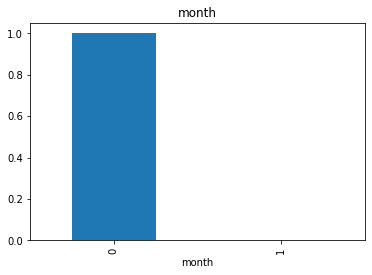

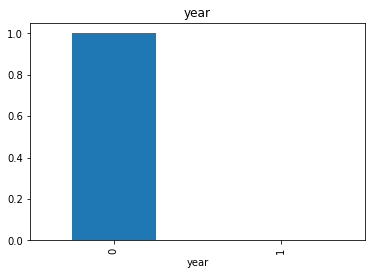

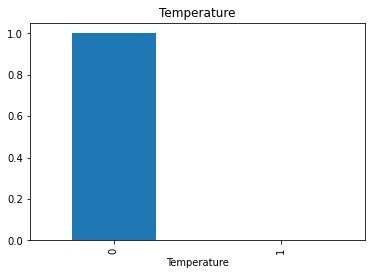

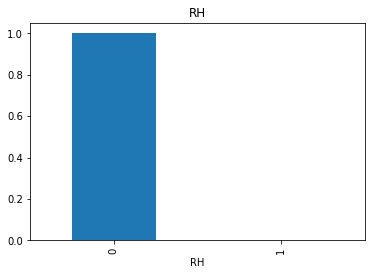

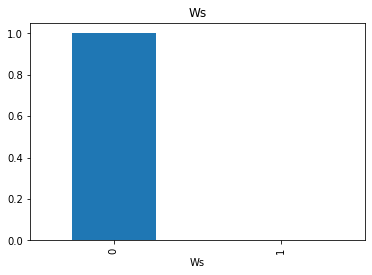

...

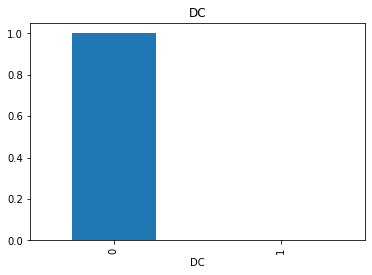

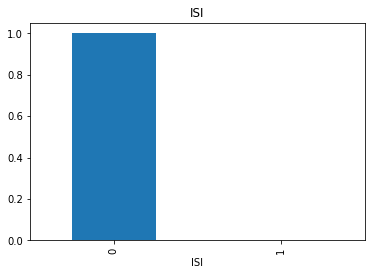

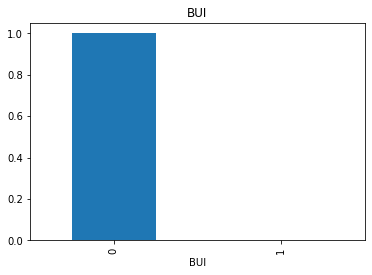

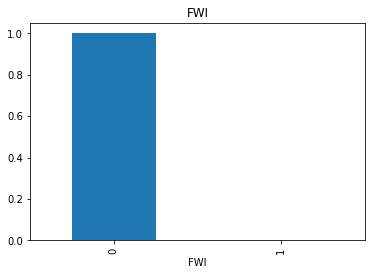

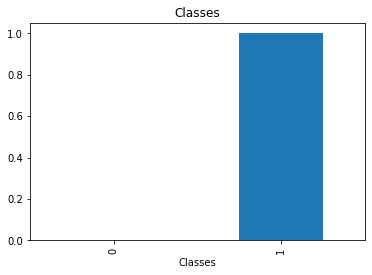

In [16]:
data['Classes']=data['Classes'].map({'not fire':0, 'fire':1})
for feature in features_with_na:
    data[feature] = np.where(data[feature].isnull(), 1,0)
    data.groupby(feature)['Classes'].median().plot.bar()
    plt.title(feature)
    plt.show()

In [17]:
df[df['Classes'].isnull()]

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
122,Sidi-Bel Abbes Region Dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
167,14,07,2012,37,37,18,0.2,88.9,12.9,14.6 9,12.5,10.4,fire,NaN


### Observation :

1. At 122th row again we can see the Dataset region name like from starting we can drop it but I had to check the above and below indexed rows and also I can able to see one category a column name ("Classes").


2. Here I also notice, in 167th row column "DC" has value 14.6 9 (having a space b/w 6 & 9 after decimal). and all the values of that column having one value after the decimal<br>


3. Column "Classes" has NaN value but the previous column "FWI" has a value 'fire'
So, here after filling data for column "DC" the person who filled the data might missed to put a "," comma after 6 and because of this the values shifted left side from their actual column
Then I decide to manually rectify it because I know the index number.

In [18]:
# Manually preprocess the datapoints
df['FWI'][167] = 10.4
df['BUI'][167] = 12.5
df['ISI'][167] = 9.0
df['DC'][167] = 14.6
df['Classes'][167] = 'fire'
df[df['Classes'].isnull()]

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
122,Sidi-Bel Abbes Region Dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
df.head(125)

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
0,01,06,2012,29,57,18,0,65.7,3.4,7.6,1.3,3.4,0.5,not fire
1,02,06,2012,29,61,13,1.3,64.4,4.1,7.6,1,3.9,0.4,not fire
2,03,06,2012,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,not fire
3,04,06,2012,25,89,13,2.5,28.6,1.3,6.9,0,1.7,0,not fire
4,05,06,2012,27,77,16,0,64.8,3,14.2,1.2,3.9,0.5,not fire
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120,29,09,2012,26,80,16,1.8,47.4,2.9,7.7,0.3,3,0.1,not fire
121,30,09,2012,25,78,14,1.4,45,1.9,7.5,0.2,2.4,0.1,not fire
122,Sidi-Bel Abbes Region Dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
123,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes


In [20]:
df=df.drop(122)
df=df.drop(123)
df.head(125)

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
0,01,06,2012,29,57,18,0,65.7,3.4,7.6,1.3,3.4,0.5,not fire
1,02,06,2012,29,61,13,1.3,64.4,4.1,7.6,1,3.9,0.4,not fire
2,03,06,2012,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,not fire
3,04,06,2012,25,89,13,2.5,28.6,1.3,6.9,0,1.7,0,not fire
4,05,06,2012,27,77,16,0,64.8,3,14.2,1.2,3.9,0.5,not fire
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120,29,09,2012,26,80,16,1.8,47.4,2.9,7.7,0.3,3,0.1,not fire
121,30,09,2012,25,78,14,1.4,45,1.9,7.5,0.2,2.4,0.1,not fire
124,01,06,2012,32,71,12,0.7,57.1,2.5,8.2,0.6,2.8,0.2,not fire
125,02,06,2012,30,73,13,4,55.7,2.7,7.8,0.6,2.9,0.2,not fire


In [21]:
# Q How many categories are present in the target feature?
# A. There are only two unique categories are present in target feature so, it should be a binary classification problem.
df['Classes'].unique()

array(['not fire', 'fire'], dtype=object)

In [22]:
# A, How many data-points for each class are present?
df['Classes'].value_counts()

fire        138
not fire    106
Name: Classes, dtype: int64

#### Checking Dataset is Balance (or) it is a imbalance dataset

In [23]:
# Q. It is a balance dataset or imnbalance dataset?
# A. I think it's a balance dataset because we we calculate the percentage of data-points 
# Fire -> 56.37860082304527% ~ 56% (approx.) and notfire -> 43.62139917695473% ~ 44% (approx.) after roundoff.

perc_fire = (df['Classes'].value_counts()['fire'] / (df['Classes'].value_counts()['fire'] + df['Classes'].value_counts()['not fire']))*100
perc_notfire = (df['Classes'].value_counts()['not fire'] / (df['Classes'].value_counts()['fire'] + df['Classes'].value_counts()['not fire']))*100

print(f"Percentage of fire according to dataset is {round(perc_fire)}%.\nand")
print(f"Percentage of non-fire according to dataset is {round(perc_notfire)}%.")

# Threshold value to determine if difference b/w the data will be greator than the Threshold value
Threshold = 15 # range b/w 15 - 20 of difference b/w the data is good enough atherwise problem may occur

if(abs(perc_fire - perc_notfire) > Threshold):
    print("Dataset is imbalanced dataset")
else:
    print("Dataset is balanced dataset")

Percentage of fire according to dataset is 57%.
and
Percentage of non-fire according to dataset is 43%.
Dataset is balanced dataset


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 244 entries, 0 to 245
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   day          244 non-null    object
 1   month        244 non-null    object
 2   year         244 non-null    object
 3   Temperature  244 non-null    object
 4   RH           244 non-null    object
 5   Ws           244 non-null    object
 6   Rain         244 non-null    object
 7   FFMC         244 non-null    object
 8   DMC          244 non-null    object
 9   DC           244 non-null    object
 10  ISI          244 non-null    object
 11  BUI          244 non-null    object
 12  FWI          244 non-null    object
 13  Classes      244 non-null    object
dtypes: object(14)
memory usage: 28.6+ KB


* All the feature are of Object type or "O" type as dtype so there is not point to differentiate numerical_feature and categorical_features.

In [25]:
df.isnull().sum()

day            0
month          0
year           0
Temperature    0
RH             0
Ws             0
Rain           0
FFMC           0
DMC            0
DC             0
ISI            0
BUI            0
FWI            0
Classes        0
dtype: int64

In [26]:
# df['Classes']=df['Classes'].map({'not fire':0, 'fire':1})
label_encoding = preprocessing.LabelEncoder()

df['Classes'] = label_encoding.fit_transform(df['Classes'])

df['Classes'].unique()
# 1 is encoded for "not fire" and 0 is encoded for "fire"

array([1, 0])

In [27]:
#Q. How many Data-points and features are there ?
#A. There are 244 data-points / rows and 14 features / columns
df.shape

(244, 14)

### 2. Converting to numeric variable

In [28]:
decimal_cols = ["Rain", "FFMC", "DMC", "DC", "ISI", "BUI", "FWI"]

for feature in decimal_cols:
    df[feature]=df[feature].astype(float)

integer_cols = ["day", "month", "year", "Temperature", "RH", "Ws", "Classes"]

for feature in integer_cols:
    df[feature]=df[feature].astype('int64')
    

In [29]:
df_plot=df.copy()

In [30]:
df_plot['Classes']=df_plot['Classes'].map({0:'fire', 1:'not fire'})

C:\Users\arpit\ineuron\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



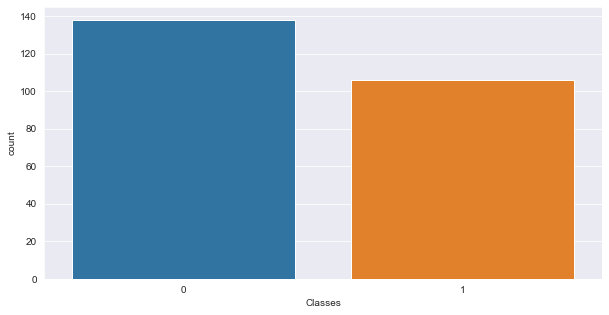

In [31]:
sns.set_style('darkgrid')
plt.figure(figsize = (10, 5))
sns.countplot(df['Classes'])
plt.show()

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 244 entries, 0 to 245
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   day          244 non-null    int64  
 1   month        244 non-null    int64  
 2   year         244 non-null    int64  
 3   Temperature  244 non-null    int64  
 4   RH           244 non-null    int64  
 5   Ws           244 non-null    int64  
 6   Rain         244 non-null    float64
 7   FFMC         244 non-null    float64
 8   DMC          244 non-null    float64
 9   DC           244 non-null    float64
 10  ISI          244 non-null    float64
 11  BUI          244 non-null    float64
 12  FWI          244 non-null    float64
 13  Classes      244 non-null    int64  
dtypes: float64(7), int64(7)
memory usage: 28.6 KB


#### PAIRPLOTS

<Figure size 1080x720 with 0 Axes>

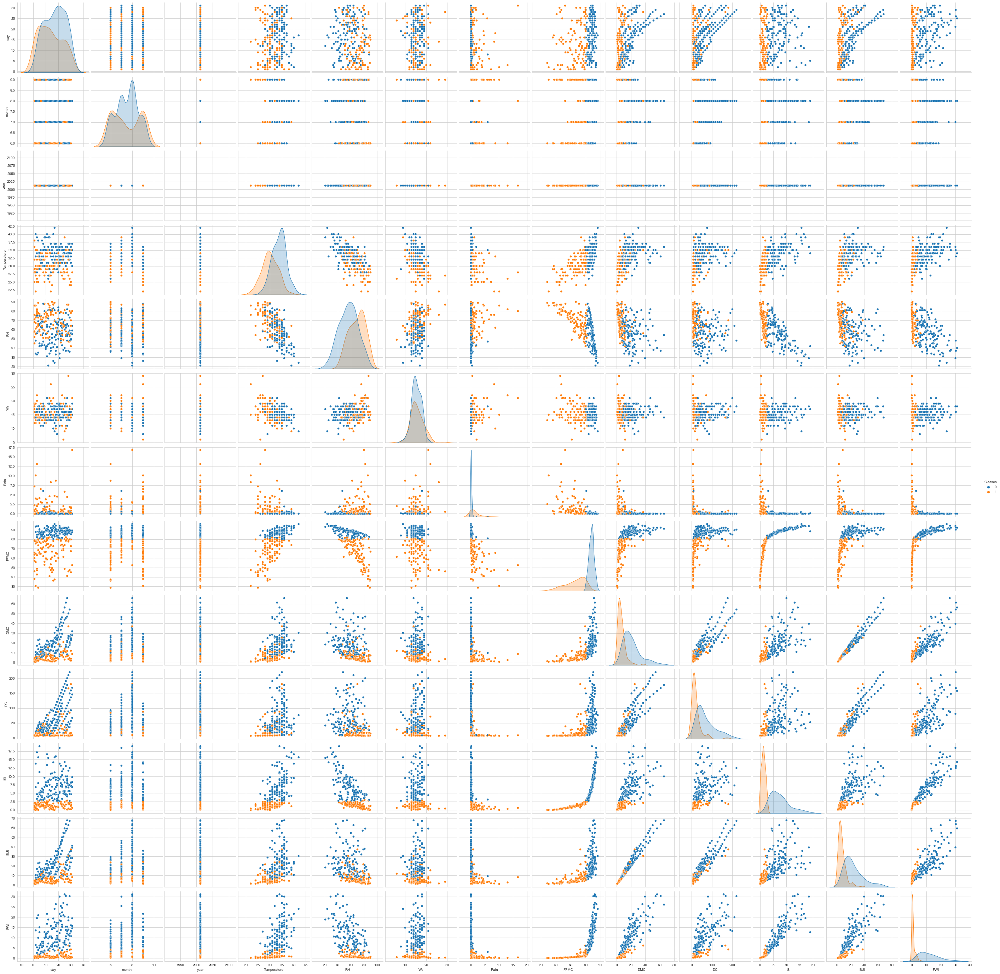

In [33]:
plt.close()
sns.set_style("whitegrid");
plt.figure(figsize=(15, 10))
sns.pairplot(df, hue="Classes", height=3)
plt.show()

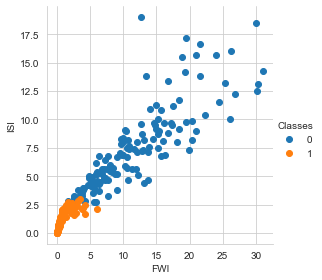

In [34]:
sns.set_style("whitegrid")
sns.FacetGrid(df, hue="Classes", height=4) \
    .map(plt.scatter, "FWI", "ISI") \
    .add_legend()
plt.show()

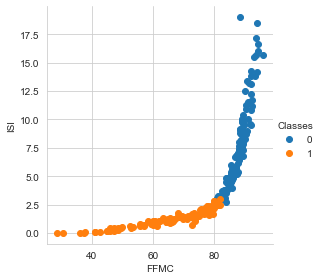

In [35]:
sns.set_style("whitegrid")
sns.FacetGrid(df, hue="Classes", height=4) \
    .map(plt.scatter, "FFMC", "ISI") \
    .add_legend()
plt.show()

### Observation:

1. Algerian Forest Fire Dataset is a Balance Dataset


2. Dataset is comprimises of two different  dataset of the different region of Algeria, so two un-useful rows have Dataset description and columns name is redundant so we have to drop it.


3. Because of typos or keyboard error or human mistake, one comma(,) is missing at 167th index so that the data after that typo shifted one column backside to original one. I just correct it.


4. According to the dataset some feature having no decimal values and some have decimal values but having dtype as object so I convert them into Int64 and Float64 respectively, Classes is a categorical feature but through LabelEncoding we assign it the float64 value (By default) but as it is Binary Classification and supervise learning their is no pobabilitical outputso I convert it into 1's and 0's (Int64) format.


5. Through countplot we can see number of fire is more that number of not fire labels. value_counts() gives 138 labels as fire and 106 labels as not fire and through Pairplots we find the scatterplot between FWI and ISI and FFMC and ISI is better in separating the two classes but occurance of Overfitting model is possible so Linear Regression is not a better option but we can try Logistic regression with L2 regulation to overcome this hypothesis (right at this stage). ISI greator than 2.5 and FFMC above 80.0 having more chance for detecting fire and below not fire Similary ISI above 2.5 and FMI greator than 5 having more chaces to detect it as fire and below the threshold chances to detect not fire .

## Univariate Analysis

In [36]:
df_plot

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
0,1,6,2012,29,57,18,0.0,65.7,3.4,7.6,1.3,3.4,0.5,not fire
1,2,6,2012,29,61,13,1.3,64.4,4.1,7.6,1.0,3.9,0.4,not fire
2,3,6,2012,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,not fire
3,4,6,2012,25,89,13,2.5,28.6,1.3,6.9,0.0,1.7,0.0,not fire
4,5,6,2012,27,77,16,0.0,64.8,3.0,14.2,1.2,3.9,0.5,not fire
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
241,26,9,2012,30,65,14,0.0,85.4,16.0,44.5,4.5,16.9,6.5,fire
242,27,9,2012,28,87,15,4.4,41.1,6.5,8.0,0.1,6.2,0.0,not fire
243,28,9,2012,27,87,29,0.5,45.9,3.5,7.9,0.4,3.4,0.2,not fire
244,29,9,2012,24,54,18,0.1,79.7,4.3,15.2,1.7,5.1,0.7,not fire


#### HISTOGRAM, PDF and CDF

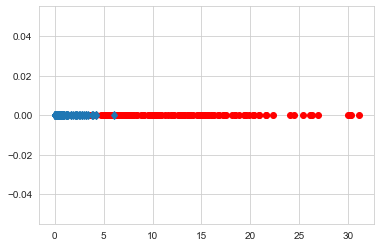

In [37]:
df_fire     = df_plot.loc[df_plot["Classes"] == 'fire']
df_not_fire = df_plot.loc[df_plot["Classes"] == 'not fire']

plt.plot(df_fire["FWI"], np.zeros_like(df_fire["FWI"]), "o", color="r")
plt.plot(df_not_fire["FWI"], np.zeros_like(df_not_fire["FWI"]), "d")

 ### Observation :
 
 1. Here we can see "diamond - shaped" or d-shaped symbol scan be easily seprable using "FWI" column from "Circular-shaped" or "o"-shaped symbols 
 
 
 2. FWI less than 4.9 ~ 5 (approx.) will be detected as "not fire" and above it are detected as "fire" 

C:\Users\arpit\AppData\Local\Temp\ipykernel_11780\3179351359.py:1: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "r+" (-> color='r'). The keyword argument will take precedence.



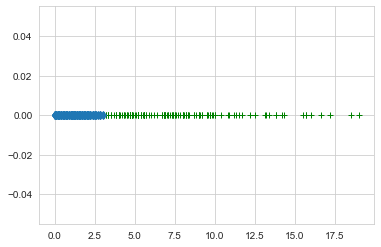

In [38]:
plt.plot(df_fire["ISI"], np.zeros_like(df_fire["ISI"]), "r+", color="green")
plt.plot(df_not_fire["ISI"], np.zeros_like(df_not_fire["ISI"]), "d")

 ### Observation :
 
 1. Here we can see "diamond - shaped" or d-shaped symbol scan be easily seprable using "ISI" column from "plus-shaped" or "+"-shaped symbols 
 
 
 2. ISI less than 2.6 ~ 2.5 (approx.) will be detected as "not fire" and above it are detected as "fire" 

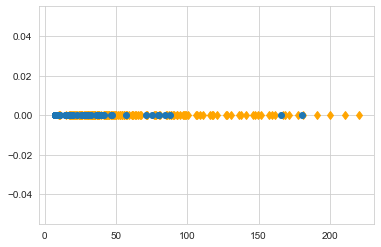

In [39]:
plt.plot(df_fire["DC"], np.zeros_like(df_fire["DC"]), "d", color="orange")
plt.plot(df_not_fire["DC"], np.zeros_like(df_not_fire["DC"]), "o")

 ### Observation :
 
 1. Here we can see "diamond - shaped" or d-shaped symbol scan be not easily seprable using "DC" column from "Circular-shaped" or "o"-shaped symbols 
 
 
 2. DC less than 50 (approx.) will be detected as "not fire" and above it are detected as "fire"  but their are many outliers

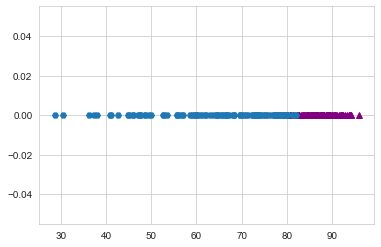

In [40]:
plt.plot(df_fire["FFMC"], np.zeros_like(df_fire["FFMC"]), "^", color="purple")
plt.plot(df_not_fire["FFMC"], np.zeros_like(df_not_fire["FFMC"]), "H")

 ### Observation :
 
 1. Here we can see "upper triangular - shaped" or ^-shaped symbol scan be easily seprable using "FFMC" column from "Hexagonal-shaped" or "H"-shaped symbols 
 
 
 2. FFMC less than 83 (approx.) will be detected as "not fire" and above it are detected as "fire" 

C:\Users\arpit\ineuron\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\arpit\ineuron\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<Figure size 1080x720 with 0 Axes>

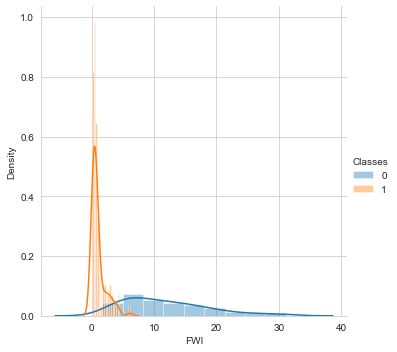

In [41]:
plt.figure(figsize=(15, 10))
sns.FacetGrid(df, hue="Classes", height=5) \
   .map(sns.distplot, "FWI") \
   .add_legend();
plt.show();

C:\Users\arpit\ineuron\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\arpit\ineuron\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<Figure size 1080x720 with 0 Axes>

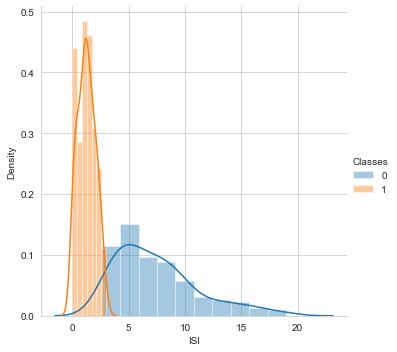

In [42]:
plt.figure(figsize=(15, 10))
sns.FacetGrid(df, hue="Classes", height=5) \
   .map(sns.distplot, "ISI") \
   .add_legend();
plt.show();

C:\Users\arpit\ineuron\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\arpit\ineuron\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<Figure size 1080x720 with 0 Axes>

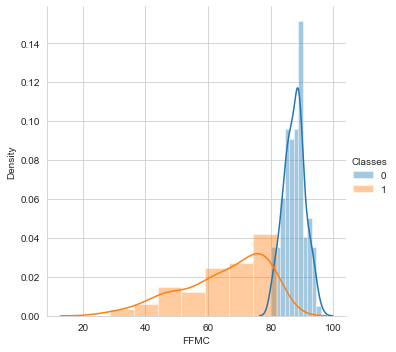

In [43]:
plt.figure(figsize=(15, 10))
sns.FacetGrid(df, hue="Classes", height=5) \
   .map(sns.distplot, "FFMC") \
   .add_legend();
plt.show();

 ### Observation :
 
1. Here we can see the spread of "fire" in above first 2 features is more than that of "not fire" category and they are right skewed or positively skewed.
 
 
 2. PDF of 3rd feature "FFMC" having negative skewed or left skewed shaped.

#### CDF vs PDF Plot

[0.12318841 0.22463768 0.15942029 0.13768116 0.13768116 0.07246377
 0.06521739 0.02173913 0.02898551 0.02898551]
[ 1.7   4.64  7.58 10.52 13.46 16.4  19.34 22.28 25.22 28.16 31.1 ]


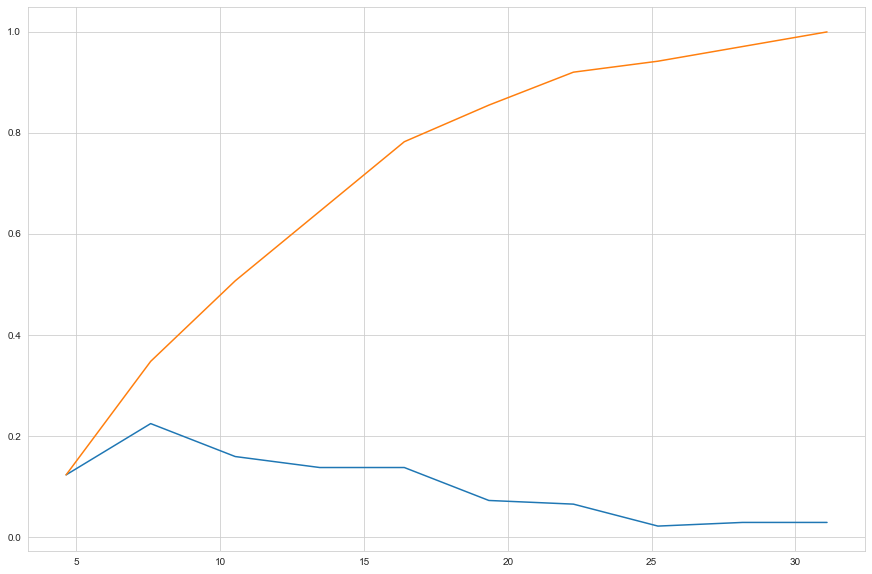

In [44]:
plt.figure(figsize=(15, 10))
counts, bin_edges = np.histogram(df_fire["FWI"], bins=10, 
                                 density=True)

pdf = counts/(sum(counts))
print(pdf)
print(bin_edges)

cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:], pdf)
plt.plot(bin_edges[1:], cdf)

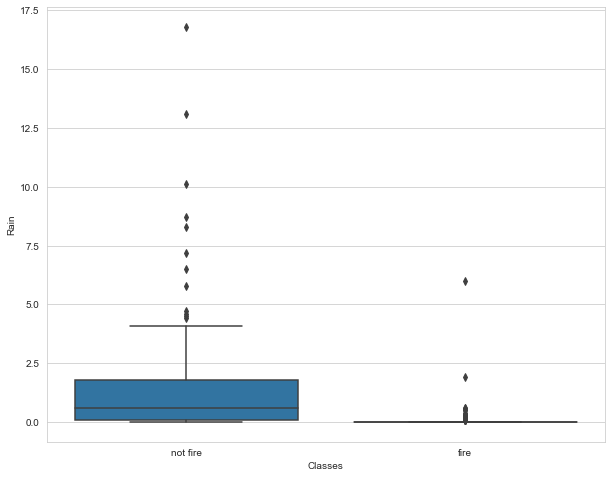

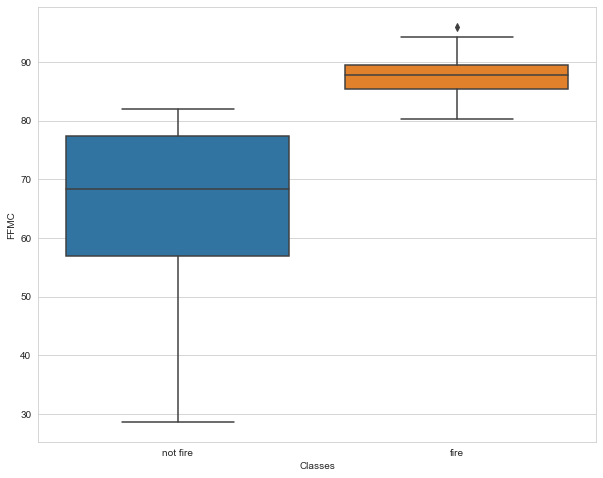

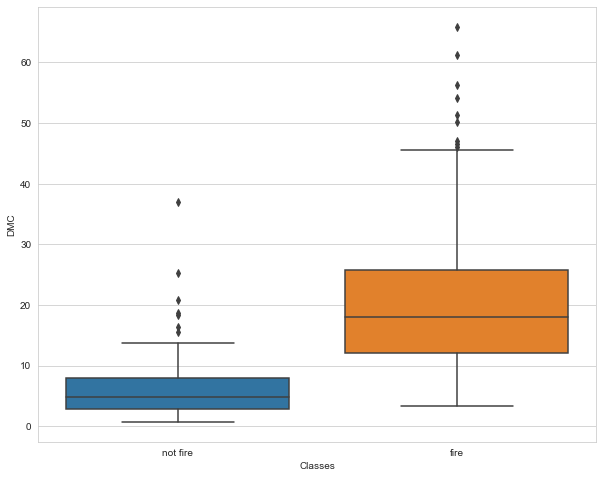

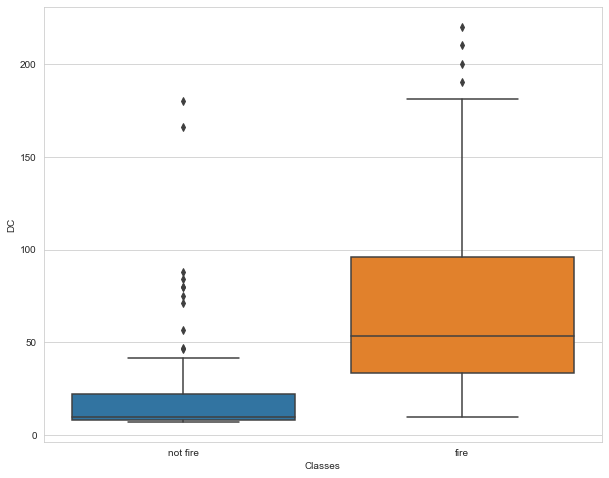

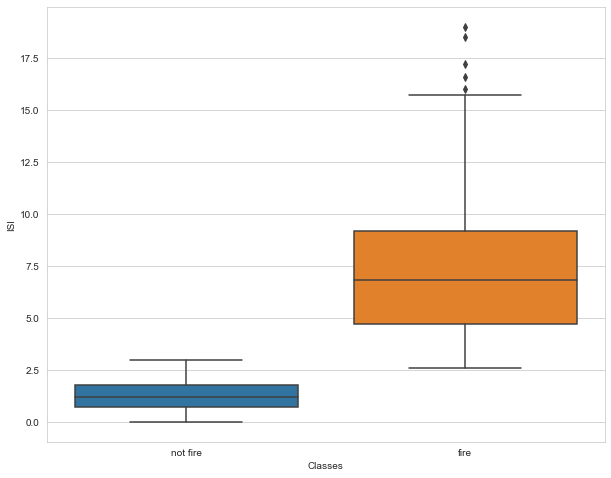

...

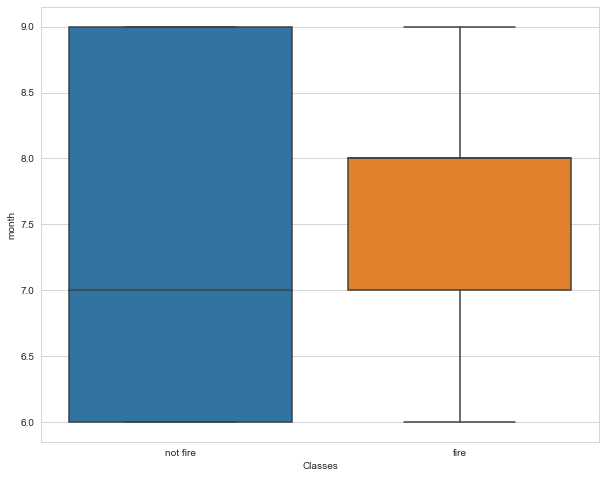

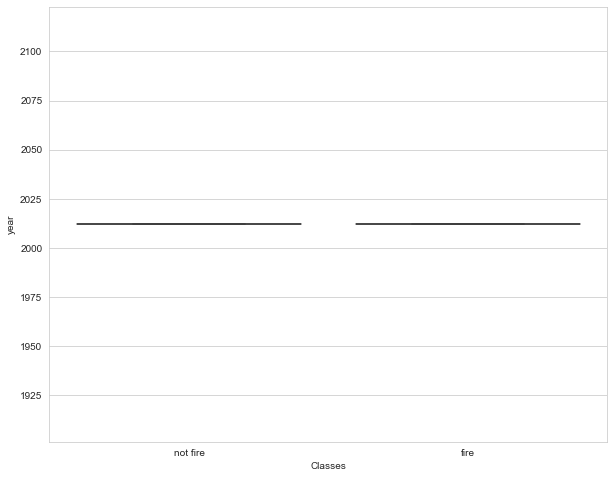

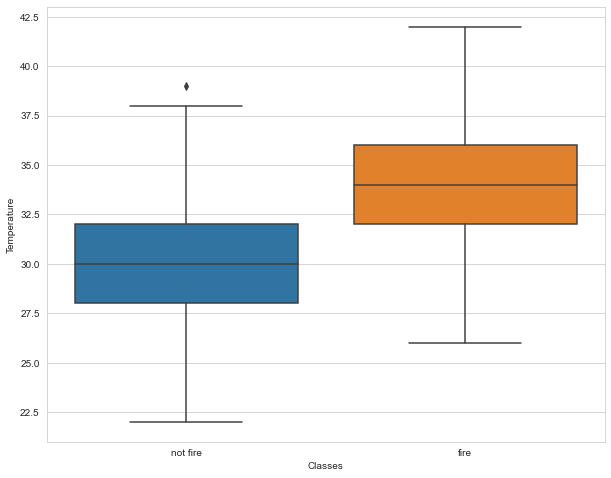

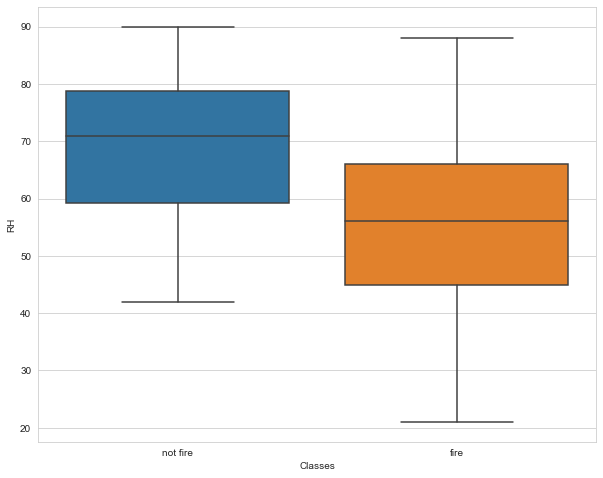

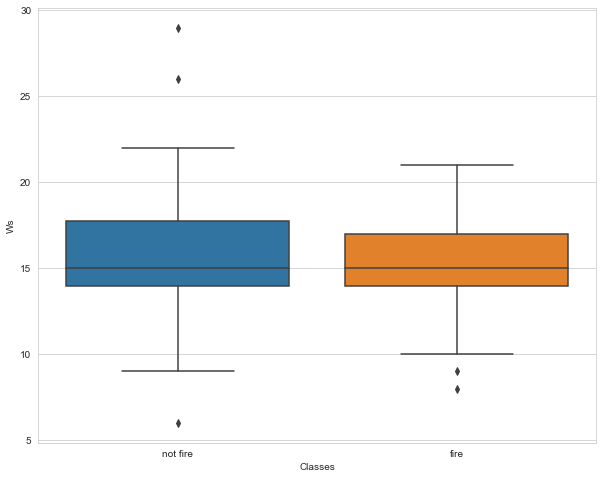

<Figure size 720x576 with 0 Axes>

In [45]:
for feature in (decimal_cols+integer_cols):
    plt.figure(figsize=(10, 8))
    if feature != 'Classes':
        sns.boxplot(x="Classes", y=feature, data=df_plot)
        plt.show()

In [46]:
feature_list = integer_cols+decimal_cols
IQR = []
for feature in feature_list:
    if feature != "Classes":
        IQR.append(df[feature].quantile(0.75) - df[feature].quantile(0.25))
        
IQR_dict = dict(zip(feature_list, IQR))
print(IQR_dict)

{'day': 15.0, 'month': 1.0, 'year': 0.0, 'Temperature': 5.0, 'RH': 21.25, 'Ws': 3.0, 'Classes': 0.5, 'Rain': 16.224999999999994, 'FFMC': 14.95, 'DMC': 54.87500000000001, 'DC': 5.9, 'ISI': 16.525, 'BUI': 10.675}


In [47]:
extreme_outliers = ["Ws", "Temperature", "BUI", "ISI", "DC", "DMC", "FFMC", "Rain"]
upper_bridge_val = []

for feature in extreme_outliers:
    upper_bridge_val.append(df[feature].quantile(0.75) + (IQR_dict[feature]*1.5))
print(upper_bridge_val)

upper_bridge = dict(zip(extreme_outliers,upper_bridge_val))
print(upper_bridge)

[21.5, 42.5, 38.5375, 32.0875, 77.0, 103.06250000000001, 110.725, 24.83749999999999]
{'Ws': 21.5, 'Temperature': 42.5, 'BUI': 38.5375, 'ISI': 32.0875, 'DC': 77.0, 'DMC': 103.06250000000001, 'FFMC': 110.725, 'Rain': 24.83749999999999}


In [48]:
df_no_outliers = df.copy()
for feature in extreme_outliers:
    df_no_outliers.loc[df_no_outliers[feature] > upper_bridge[feature], feature] = upper_bridge[feature]

Text(0, 0.5, 'Classes')

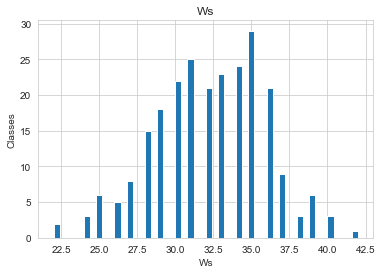

In [49]:
fig=df_no_outliers.Temperature.hist(bins=50)
fig.set_title('Ws')
fig.set_xlabel('Ws')
fig.set_ylabel("Classes")

Text(0, 0.5, 'Classes')

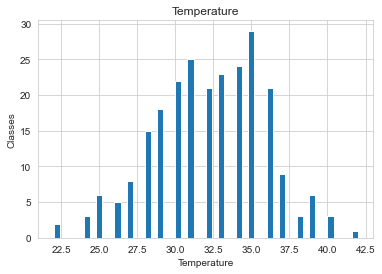

In [50]:
fig=df_no_outliers.Temperature.hist(bins=50)
fig.set_title('Temperature')
fig.set_xlabel('Temperature')
fig.set_ylabel("Classes")

### Observation :

1. As we can see in box plot many feature having "higher outliers" or  right skewed distribution so I handled them using Statistical method IQR (Inter Quantile Range) formula.

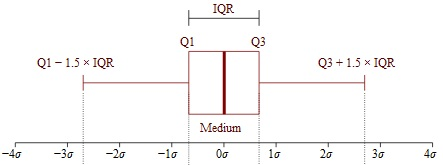

2. I had created list of feature and list of associated IQR values to those list and in similar way to find associated Upper boundary for those outliers than I used zip() to make dictionary for easy calculation accoring to the feature.


In [51]:
df.describe()

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
count,244.000000,244.000000,244.0,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000
mean,15.754098,7.500000,2012.0,32.172131,61.938525,15.504098,0.760656,77.887705,14.673361,49.288115,4.759836,16.673361,7.049180,0.434426
std,8.825059,1.112961,0.0,3.633843,14.884200,2.810178,1.999406,14.337571,12.368039,47.619662,4.154628,14.201648,7.428366,0.496700
min,1.000000,6.000000,2012.0,22.000000,21.000000,6.000000,0.000000,28.600000,0.700000,6.900000,0.000000,1.100000,0.000000,0.000000
25%,8.000000,7.000000,2012.0,30.000000,52.000000,14.000000,0.000000,72.075000,5.800000,13.275000,1.400000,6.000000,0.700000,0.000000
50%,16.000000,7.500000,2012.0,32.000000,63.000000,15.000000,0.000000,83.500000,11.300000,33.100000,3.500000,12.450000,4.450000,0.000000
75%,23.000000,8.000000,2012.0,35.000000,73.250000,17.000000,0.500000,88.300000,20.750000,68.150000,7.300000,22.525000,11.375000,1.000000
max,31.000000,9.000000,2012.0,42.000000,90.000000,29.000000,16.800000,96.000000,65.900000,220.400000,19.000000,68.000000,31.100000,1.000000


In [52]:
df.corr()

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
day,1.000000e+00,2.232788e-17,NaN,0.095772,-0.074209,0.047001,-0.112265,0.224032,0.491571,0.527929,0.179301,0.517224,0.350234,-0.201784
month,2.232788e-17,1.000000e+00,NaN,-0.059017,-0.037884,-0.041447,0.035322,0.015577,0.068178,0.127672,0.063545,0.085567,0.081732,-0.022333
year,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Temperature,9.577222e-02,-5.901677e-02,NaN,1.000000,-0.654443,-0.278132,-0.326786,0.677491,0.483105,0.370498,0.605971,0.456415,0.566839,-0.518119
RH,-7.420934e-02,-3.788419e-02,NaN,-0.654443,1.000000,0.236084,0.222968,-0.645658,-0.405133,-0.220330,-0.688268,-0.349685,-0.580457,0.435023
Ws,4.700086e-02,-4.144673e-02,NaN,-0.278132,0.236084,1.000000,0.170169,-0.163255,-0.001246,0.076245,0.012245,0.030303,0.033957,0.066529
Rain,-1.122654e-01,3.532207e-02,NaN,-0.326786,0.222968,0.170169,1.000000,-0.544045,-0.288548,-0.296804,-0.347862,-0.299409,-0.324755,0.379449
FFMC,2.240321e-01,1.557668e-02,NaN,0.677491,-0.645658,-0.163255,-0.544045,1.000000,0.602391,0.503910,0.740751,0.590251,0.691430,-0.770114
DMC,4.915710e-01,6.817778e-02,NaN,0.483105,-0.405133,-0.001246,-0.288548,0.602391,1.000000,0.875358,0.678355,0.982206,0.875191,-0.584188
DC,5.279285e-01,1.276719e-01,NaN,0.370498,-0.220330,0.076245,-0.296804,0.503910,0.875358,1.000000,0.503919,0.941672,0.737041,-0.507122


<AxesSubplot:>

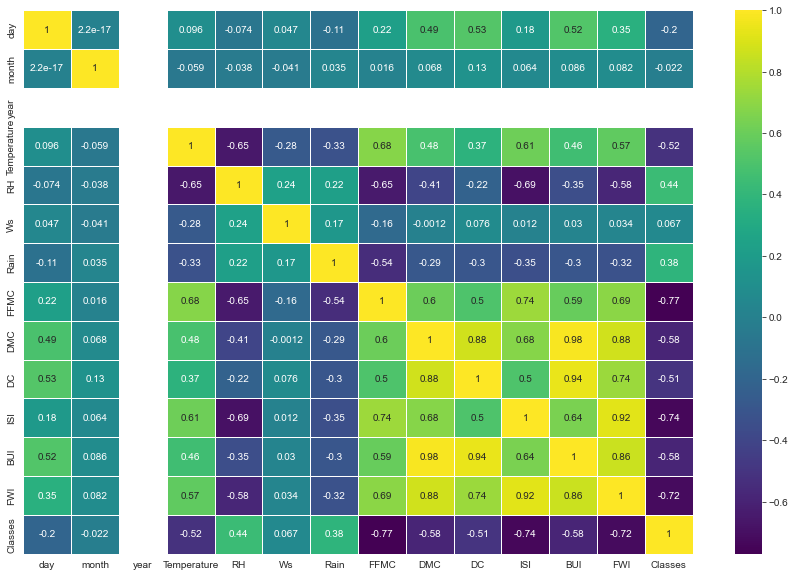

In [53]:
plt.figure(figsize=(15, 10))
sns.heatmap(df.corr(),annot=True,cmap='viridis',linewidths=.5)

In [54]:
df=df.drop(columns=['day','year'])
df['month'] = df['month'].astype('Int64')

<AxesSubplot:>

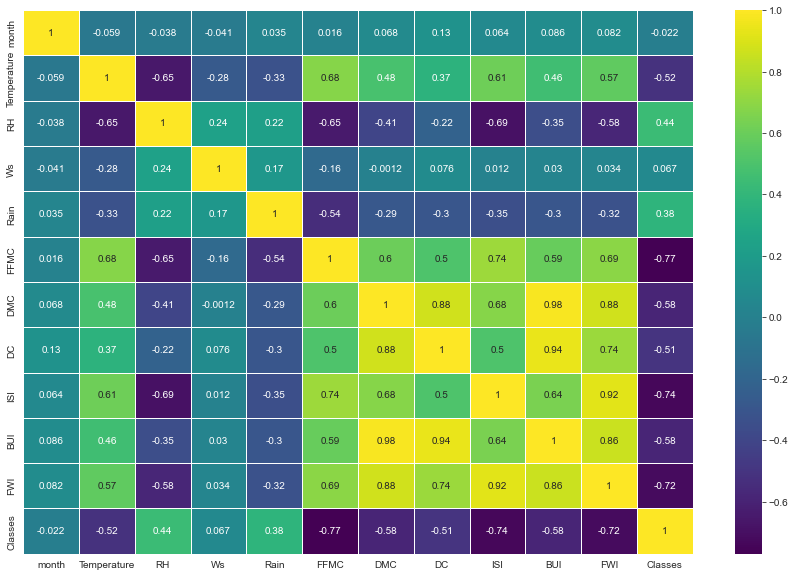

In [55]:
plt.figure(figsize=(15, 10))
sns.heatmap(df.corr(),annot=True,cmap='viridis',linewidths=.5)

In [56]:
df.shape

(244, 12)

## Observation :

1. Df.corr() gives the relationship or correlation between different feature and we can select and do feature selection according to it.


2. As we can see feature like 'year' and 'day' are weakly correlated and we can remove it or drop it.

In [57]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [58]:
profile=df.profile_report()
profile.to_file("output.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [59]:
df

,month,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
0,6,29,57,18,0.0,65.7,3.4,7.6,1.3,3.4,0.5,1
1,6,29,61,13,1.3,64.4,4.1,7.6,1.0,3.9,0.4,1
2,6,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,1
3,6,25,89,13,2.5,28.6,1.3,6.9,0.0,1.7,0.0,1
4,6,27,77,16,0.0,64.8,3.0,14.2,1.2,3.9,0.5,1
...,...,...,...,...,...,...,...,...,...,...,...,...
241,9,30,65,14,0.0,85.4,16.0,44.5,4.5,16.9,6.5,0
242,9,28,87,15,4.4,41.1,6.5,8.0,0.1,6.2,0.0,1
243,9,27,87,29,0.5,45.9,3.5,7.9,0.4,3.4,0.2,1
244,9,24,54,18,0.1,79.7,4.3,15.2,1.7,5.1,0.7,1


In [60]:
numerical_df=df.copy()
nor = Normalizer()
nor.fit(numerical_df.iloc[:,:-1])
transformed = nor.transform(numerical_df.iloc[:,:-1])

In [61]:
transformed.min(axis = 0), transformed.max(axis = 0)

(array([0.03042026, 0.13021929, 0.16856873, 0.05866501, 0.        ,
        0.29148186, 0.00727081, 0.06970818, 0.        , 0.01142555,
        0.        ]),
 array([0.10044092, 0.36748868, 0.90705892, 0.27144944, 0.16056013,
        0.82529087, 0.28375583, 0.83807819, 0.1528331 , 0.29279813,
        0.20137299]))

# ML MODELS

### Regressors:

1. Linear Regression
2. Ridge Regression
3. Lasso Regression
4. ElasticNet
5. Support Vector Regressor
6. Random Forest Regressor

### Classifiers:

1. Logistic Regression
2. Support Vector Classifier
3. KNN Classifier
4. Decision Tree Classifier
5. Gaussian Naive Bayes
6. random forest classifier

In [62]:
X=df.iloc[:,:-1] ## independent features
y=df.iloc[:,-1] ## dependent features

In [63]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

<b>R-squared :</b> Compares your models predictions to the mean of the targets. Values can ranges from negative infinity (a very poor model) to 1. 

for ex: if all your model does is predict the mean of the targets, it's R^2 value would be 0.

## Regression Models

## Linear Regression

In [64]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

lin_regressor=LinearRegression()
mse_=cross_val_score(lin_regressor,X,y,scoring='neg_mean_squared_error',cv=5)
mean_mse=np.mean(mse_)
y_test_mean = np.full(len(y_test), y_test.mean())
lin_regressor.fit(X_train,y_train)
print(y_test.mean())
print(mean_mse)

0.4594594594594595
-0.09193928853986742


In [65]:
r2_score(y_test, y_test_mean)

0.0

In [66]:
r2_score(y_test, y_test)

1.0

In [67]:
y_pred = lin_regressor.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(mse)

0.08023797021978266


## Ridge Regression

In [68]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

ridge=Ridge()
parameters={'alpha':[1e-15,1e-10,1e-8,1e-3,1e-2,1,5,10,20,30,35,40,45,50,55,100]}
ridge_regressor=GridSearchCV(ridge,parameters,scoring='neg_mean_squared_error',cv=5)
ridge_regressor.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 0.001, 0.01, 1, 5, 10,
                                   20, 30, 35, 40, 45, 50, 55, 100]},
             scoring='neg_mean_squared_error')

In [69]:
print(ridge_regressor.best_params_)
print(ridge_regressor.best_score_)

{'alpha': 100}
-0.07841550767957292


In [70]:
y_test_mean = np.full(len(y_test), y_test.mean())
print(y_test.mean())

0.4594594594594595


In [71]:
r2_score(y_test, y_test_mean)

0.0

In [72]:
r2_score(y_test, y_test)

1.0

In [73]:
y_pred = ridge_regressor.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(mse)

0.0808682414009572


## Lasso Regression

In [74]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
lasso=Lasso()
parameters={'alpha':[1e-15,1e-10,1e-8,1e-3,1e-2,1,5,10,20,30,35,40,45,50,55,100]}
lasso_regressor=GridSearchCV(lasso,parameters,scoring='neg_mean_squared_error',cv=5)

lasso_regressor.fit(X_train,y_train)
print(lasso_regressor.best_params_)
print(lasso_regressor.best_score_)

C:\Users\arpit\ineuron\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.544e+00, tolerance: 3.212e-03

C:\Users\arpit\ineuron\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.392e+00, tolerance: 3.311e-03

C:\Users\arpit\ineuron\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.996e+00, tolerance: 3.340e-03

C:\Users\arpit\ineuron\lib\site-packages\sklearn\linear_model\_coordinate

{'alpha': 0.01}
-0.08092155135684016


In [75]:
y_test_mean = np.full(len(y_test), y_test.mean())
print(y_test.mean())

0.4594594594594595


In [76]:
r2_score(y_test, y_test_mean)

0.0

In [77]:
r2_score(y_test, y_test)

1.0

In [78]:
y_pred = lasso_regressor.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(mse)

0.081254052258254


In [79]:
prediction_lasso=lasso_regressor.predict(X_test)
prediction_ridge=ridge_regressor.predict(X_test)

C:\Users\arpit\ineuron\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='Classes', ylabel='Density'>

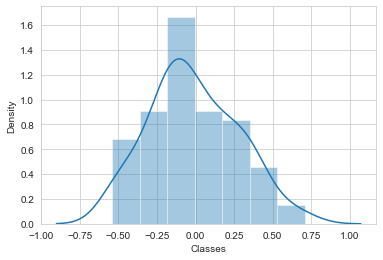

In [80]:
import seaborn as sns

sns.distplot(y_test-prediction_lasso)

C:\Users\arpit\ineuron\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='Classes', ylabel='Density'>

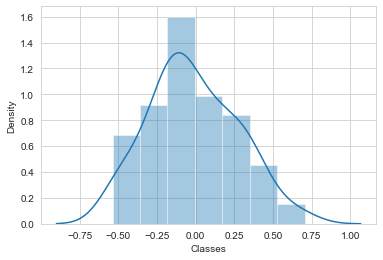

In [81]:
import seaborn as sns

sns.distplot(y_test-prediction_ridge)

## Elastic Net

In [82]:
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV

elasticnet=ElasticNet()
parameters={'alpha':[1e-15,1e-10,1e-8,1e-3,1e-2,1,5,10,20,30,35,40,45,50,55,100]}
elasticnet_regressor=GridSearchCV(elasticnet,parameters,scoring='neg_mean_squared_error',cv=5)
elasticnet_regressor.fit(X_train,y_train)

C:\Users\arpit\ineuron\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.544e+00, tolerance: 3.212e-03

C:\Users\arpit\ineuron\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.392e+00, tolerance: 3.311e-03

C:\Users\arpit\ineuron\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.996e+00, tolerance: 3.340e-03

C:\Users\arpit\ineuron\lib\site-packages\sklearn\linear_model\_coordinate

GridSearchCV(cv=5, estimator=ElasticNet(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 0.001, 0.01, 1, 5, 10,
                                   20, 30, 35, 40, 45, 50, 55, 100]},
             scoring='neg_mean_squared_error')

In [83]:
y_test_mean = np.full(len(y_test), y_test.mean())
print(y_test.mean())

0.4594594594594595


In [84]:
r2_score(y_test, y_test_mean)

0.0

In [85]:
r2_score(y_test, y_test)

1.0

In [86]:
y_pred = elasticnet_regressor.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(mse)

0.08115072082663634


In [87]:
print(elasticnet_regressor.best_params_)
print(elasticnet_regressor.best_score_)
prediction_elasticnet=elasticnet_regressor.predict(X_test)

{'alpha': 0.01}
-0.08125544392529317


C:\Users\arpit\ineuron\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='Classes', ylabel='Density'>

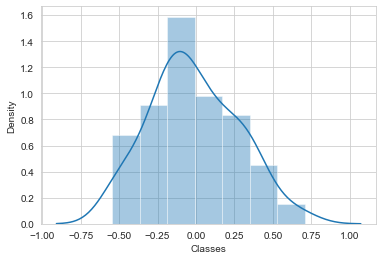

In [88]:
sns.distplot(y_test-prediction_elasticnet)

## Support Vector Regressor

In [89]:
from sklearn.svm import SVR
svr=SVR(kernel="rbf")
svr.fit(X_train,y_train)

SVR()

In [90]:
from sklearn.metrics import accuracy_score
y_pred = svr.predict(X_test)
accuracy_score(y_test, np.round(abs(y_pred)), normalize=True) 

0.9324324324324325

In [91]:
pred = svr.predict(X_test)
print('\n')
print(confusion_matrix(y_test,np.round(abs(pred))))
print('\n')
print(classification_report(y_test,np.round(abs(pred))))



[[38  2]
 [ 3 31]]


              precision    recall  f1-score   support

           0       0.93      0.95      0.94        40
           1       0.94      0.91      0.93        34

    accuracy                           0.93        74
   macro avg       0.93      0.93      0.93        74
weighted avg       0.93      0.93      0.93        74



In [92]:
y_test_mean = np.full(len(y_test), y_test.mean())
print(y_test.mean())

0.4594594594594595


In [93]:
r2_score(y_test, y_test_mean)

0.0

In [94]:
r2_score(y_test, y_test)

1.0

In [95]:
y_pred = svr.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(mse)

0.08011431041955283


## Random Forest Regressor

In [96]:
from sklearn.ensemble import RandomForestRegressor
rfr=RandomForestRegressor(n_estimators = 8, n_jobs=-1)
rfr.fit(X_train,y_train)

RandomForestRegressor(n_estimators=8, n_jobs=-1)

In [97]:
from sklearn.metrics import accuracy_score
y_pred = rfr.predict(X_test)
accuracy_score(y_test, np.round(abs(y_pred)), normalize=True) 

0.972972972972973

In [98]:
pred = rfr.predict(X_test)
print('\n')
print(confusion_matrix(y_test,np.round(abs(pred))))
print('\n')
print(classification_report(y_test,np.round(abs(pred))))



[[39  1]
 [ 1 33]]


              precision    recall  f1-score   support

           0       0.97      0.97      0.97        40
           1       0.97      0.97      0.97        34

    accuracy                           0.97        74
   macro avg       0.97      0.97      0.97        74
weighted avg       0.97      0.97      0.97        74



In [99]:
y_test_mean = np.full(len(y_test), y_test.mean())
print(y_test.mean())

0.4594594594594595


In [100]:
r2_score(y_test, y_test_mean)

0.0

In [101]:
r2_score(y_test, y_test)

1.0

In [102]:
y_pred = rfr.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(mse)

0.01752533783783784


## Classification Models

## Logistic Regression

In [103]:
from sklearn.linear_model import LogisticRegression
regression=LogisticRegression()
from sklearn.model_selection import GridSearchCV

parameter={'C':[0.5,1,2,3,5,6,7,9,10,30,45],'penalty':['l1','l2','elasticnet']}
log_regressor=GridSearchCV(regression,parameter,scoring='accuracy',cv=5)

log_regressor.fit(X_train,y_train)

C:\Users\arpit\ineuron\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\arpit\ineuron\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\arpit\ineuron\lib\site-packages\sklea

C:\Users\arpit\ineuron\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\arpit\ineuron\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\arpit\ineuron\lib\site-packages\sklea

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [0.5, 1, 2, 3, 5, 6, 7, 9, 10, 30, 45],
                         'penalty': ['l1', 'l2', 'elasticnet']},
             scoring='accuracy')

In [104]:
print(log_regressor.best_params_)

{'C': 2, 'penalty': 'l2'}


In [105]:
print(log_regressor.best_score_)

0.9588235294117646


In [106]:
prediction_log=log_regressor.predict(X_test)

In [107]:
from sklearn.metrics import accuracy_score,confusion_matrix,precision_recall_curve,roc_auc_score,f1_score
confusion_matrix(y_test,prediction_log)

array([[38,  2],
       [ 0, 34]], dtype=int64)

In [108]:
f1_score(y_test,prediction_log)

0.9714285714285714

In [109]:
print(classification_report(y_test,prediction_log))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97        40
           1       0.94      1.00      0.97        34

    accuracy                           0.97        74
   macro avg       0.97      0.97      0.97        74
weighted avg       0.97      0.97      0.97        74



## Gaussian Naive Bayes Classification  Model

In [110]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train, y_train)

GaussianNB()

In [111]:
y_pred = gnb.predict(X_test)
print('Model accuracy score: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score: 0.9459


In [112]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95        40
           1       0.94      0.94      0.94        34

    accuracy                           0.95        74
   macro avg       0.95      0.95      0.95        74
weighted avg       0.95      0.95      0.95        74



In [113]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(df.drop('Classes',axis=1))
scaled_features = scaler.transform(df.drop('Classes',axis=1))
df_scaled = pd.DataFrame(scaled_features,columns=df.columns[:-1])
df_scaled.head()

,month,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI
0,-1.350526,-0.874735,-0.332478,0.889990,-0.381223,-0.851801,-0.913365,-0.877239,-0.834479,-0.936556,-0.883457
1,-1.350526,-0.874735,-0.063185,-0.892913,0.270307,-0.942658,-0.856651,-0.877239,-0.906836,-0.901277,-0.896947
2,-1.350526,-1.702005,1.350607,2.316313,6.184192,-2.151758,-0.986283,-0.887760,-1.075669,-0.985948,-0.937415
3,-1.350526,-1.977761,1.821872,-0.892913,0.871719,-3.444727,-1.083506,-0.891969,-1.148026,-1.056507,-0.950905
4,-1.350526,-1.426248,1.013990,0.176829,-0.381223,-0.914702,-0.945773,-0.738355,-0.858598,-0.901277,-0.883457


## K-Nearest Neighbor Classifier

In [114]:
from sklearn.neighbors import KNeighborsClassifier

## Chossing Value of K

In [115]:
accuracy_rate = []

# Will take some time
for i in range(1,40):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    score=cross_val_score(knn,df_scaled,df['Classes'],cv=10)
    accuracy_rate.append(score.mean())

In [116]:
error_rate = []

# Will take some time
for i in range(1,40):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    score=cross_val_score(knn,df_scaled,df['Classes'],cv=10)
    error_rate.append(1-score.mean())

In [117]:
error_rate = []

# Will take some time
for i in range(1,40):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

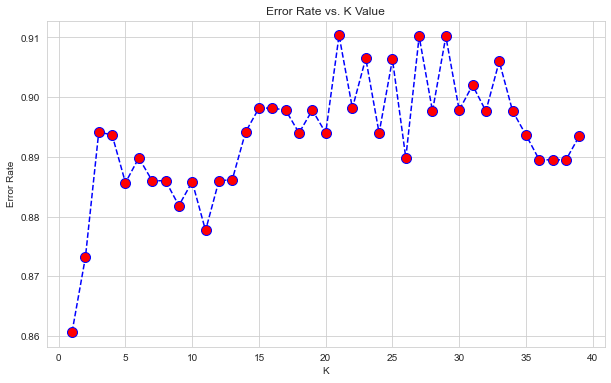

In [118]:
plt.figure(figsize=(10,6))
#plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
  #       markerfacecolor='red', markersize=10)
plt.plot(range(1,40),accuracy_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

Optimal k value is 3


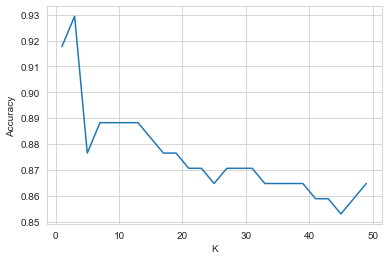

In [119]:
k_values = [i for i in range(1, 50, 2)]
k_acc_scores = []

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k, n_jobs=-1)
    cv_scores = cross_val_score(knn, X_train, y_train, cv=5, scoring='accuracy')
    k_acc_scores.append(cv_scores.mean())

optimal_k = k_values[k_acc_scores.index(max(k_acc_scores))]

print(f"Optimal k value is {optimal_k}")

plt.plot(k_values, k_acc_scores)
plt.xlabel("K")
plt.ylabel("Accuracy")
plt.show()

In [120]:
# NOW WITH K=3
knn = KNeighborsClassifier(n_neighbors=3)

knn.fit(X_train,y_train)
pred = knn.predict(X_test)

print('WITH K=3')
print('\n')
print(confusion_matrix(y_test,pred))
print('\n')
print(classification_report(y_test,pred))

WITH K=3


[[36  4]
 [ 3 31]]


              precision    recall  f1-score   support

           0       0.92      0.90      0.91        40
           1       0.89      0.91      0.90        34

    accuracy                           0.91        74
   macro avg       0.90      0.91      0.90        74
weighted avg       0.91      0.91      0.91        74



## Support Vector Classifier

In [121]:
from sklearn.svm import SVC
svc=SVC(kernel="rbf")
svc.fit(X_train,y_train)

SVC()

In [122]:
from sklearn.metrics import accuracy_score
y_pred = svc.predict(X_test)
accuracy_score(y_test, y_pred)

0.918918918918919

In [123]:
pred = svc.predict(X_test)
print('\n')
print(confusion_matrix(y_test,pred))
print('\n')
print(classification_report(y_test,pred))



[[37  3]
 [ 3 31]]


              precision    recall  f1-score   support

           0       0.93      0.93      0.93        40
           1       0.91      0.91      0.91        34

    accuracy                           0.92        74
   macro avg       0.92      0.92      0.92        74
weighted avg       0.92      0.92      0.92        74



## Decision Tree Classifier

In [124]:
from sklearn.tree import DecisionTreeClassifier
dtc=DecisionTreeClassifier()
dtc.fit(X_train,y_train)

DecisionTreeClassifier()

[Text(0.5, 0.9, 'X[8] <= 2.55\ngini = 0.488\nsamples = 170\nvalue = [98, 72]'),
 Text(0.3333333333333333, 0.7, 'gini = 0.0\nsamples = 69\nvalue = [0, 69]'),
 Text(0.6666666666666666, 0.7, 'X[5] <= 82.0\ngini = 0.058\nsamples = 101\nvalue = [98, 3]'),
 Text(0.5, 0.5, 'X[6] <= 9.75\ngini = 0.49\nsamples = 7\nvalue = [4, 3]'),
 Text(0.3333333333333333, 0.3, 'X[6] <= 7.2\ngini = 0.375\nsamples = 4\nvalue = [1, 3]'),
 Text(0.16666666666666666, 0.1, 'gini = 0.0\nsamples = 1\nvalue = [1, 0]'),
 Text(0.5, 0.1, 'gini = 0.0\nsamples = 3\nvalue = [0, 3]'),
 Text(0.6666666666666666, 0.3, 'gini = 0.0\nsamples = 3\nvalue = [3, 0]'),
 Text(0.8333333333333334, 0.5, 'gini = 0.0\nsamples = 94\nvalue = [94, 0]')]

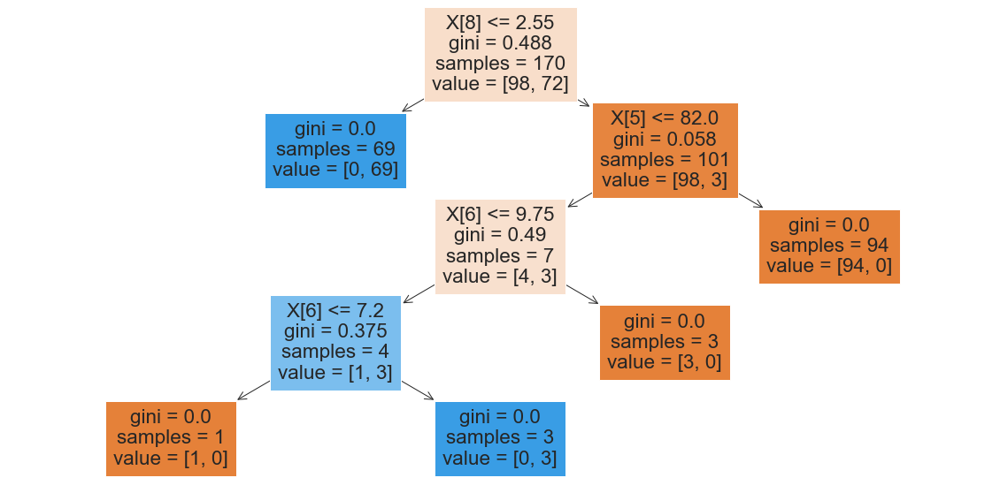

In [125]:
from sklearn import tree
plt.figure(figsize=(20,10))
tree.plot_tree(dtc,filled=True)

In [126]:
pred = dtc.predict(X_test)
print('\n')
print(confusion_matrix(y_test,pred))
print('\n')
print(classification_report(y_test,pred))



[[39  1]
 [ 2 32]]


              precision    recall  f1-score   support

           0       0.95      0.97      0.96        40
           1       0.97      0.94      0.96        34

    accuracy                           0.96        74
   macro avg       0.96      0.96      0.96        74
weighted avg       0.96      0.96      0.96        74



In [127]:
y_pred = dtc.predict(X_test)
accuracy_score(y_test, y_pred)

0.9594594594594594

## Random Forest Classifier

In [128]:
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(n_estimators = 8, n_jobs=-1)
rfc.fit(X_train,y_train)

RandomForestClassifier(n_estimators=8, n_jobs=-1)

In [129]:
pred = rfc.predict(X_test)
print('\n')
print(confusion_matrix(y_test,pred))
print('\n')
print(classification_report(y_test,pred))



[[38  2]
 [ 1 33]]


              precision    recall  f1-score   support

           0       0.97      0.95      0.96        40
           1       0.94      0.97      0.96        34

    accuracy                           0.96        74
   macro avg       0.96      0.96      0.96        74
weighted avg       0.96      0.96      0.96        74



In [130]:
from sklearn.metrics import accuracy_score
y_pred = rfc.predict(X_test)
accuracy_score(y_test, y_pred)

0.9594594594594594

In [131]:
from sklearn.ensemble import AdaBoostClassifier
adaboost = AdaBoostClassifier()
adaboost.fit(X_train, y_train)

AdaBoostClassifier()

In [132]:
y_pred = adaboost.predict(X_test)
accuracy_score(y_test, y_pred)

1.0

In [133]:
pred = adaboost.predict(X_test)
print('\n')
print(confusion_matrix(y_test,pred))
print('\n')
print(classification_report(y_test,pred))



[[40  0]
 [ 0 34]]


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        40
           1       1.00      1.00      1.00        34

    accuracy                           1.00        74
   macro avg       1.00      1.00      1.00        74
weighted avg       1.00      1.00      1.00        74



In [134]:
from sklearn.ensemble import GradientBoostingClassifier
gboost = GradientBoostingClassifier()
gboost.fit(X_train, y_train)

GradientBoostingClassifier()

In [135]:
y_pred = gboost.predict(X_test)
accuracy_score(y_test, y_pred)

1.0

In [136]:
pred = gboost.predict(X_test)
print('\n')
print(confusion_matrix(y_test,pred))
print('\n')
print(classification_report(y_test,pred))



[[40  0]
 [ 0 34]]


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        40
           1       1.00      1.00      1.00        34

    accuracy                           1.00        74
   macro avg       1.00      1.00      1.00        74
weighted avg       1.00      1.00      1.00        74



# Conclusion:

1. As we can see In Regressors Model , Random Forest Regressor having maximum accuracy upto 95% (approx.) to other regressor models.
2. In Classifiers Model Random Forest Classifier having better accuracy than other classifiers models .
3. I choose Random Forest Classifier because both Random Forest Regressor and Random Forest Classifier haveing same accuracy but I select regressor because Regression algorithms are used to predict the continuous values such as price, salary, age, etc. and Classification algorithms are used to predict/Classify the discrete values such as Male or Female, True or False, Spam or Not Spam, fire or not fire etc

# Deployment Phase

## Saving the Selected Model in .pkl file format 

In [137]:
import pickle

In [138]:
pickle.dump(rfc, open('model.pkl', 'wb'))

In [139]:
!pip install flask

In [140]:
pickled_model = pickle.load(open('model.pkl', 'rb'))

In [141]:
pickled_model.predict(X_test)

array([0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1,
       1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0,
       0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0,
       0, 1, 1, 1, 1, 0, 1, 0], dtype=int64)

In [142]:
X_test

,month,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI
64,8,34,69,13,0.0,85.0,8.2,19.8,4.0,8.2,3.9
63,8,35,63,14,0.3,76.6,5.7,10.0,1.7,5.5,0.8
55,7,36,53,19,0.0,89.2,17.1,98.6,10.0,23.9,15.3
111,9,28,84,18,0.0,83.8,13.5,49.3,4.5,16.0,6.3
227,9,31,72,14,0.0,84.2,8.3,25.2,3.8,9.1,3.9
...,...,...,...,...,...,...,...,...,...,...,...
90,8,35,70,17,0.8,72.7,25.2,180.4,1.7,37.4,4.2
101,9,33,73,12,1.8,59.9,2.2,8.9,0.7,2.7,0.3
75,8,36,55,13,0.3,82.4,15.6,92.5,3.7,22.0,6.3
4,6,27,77,16,0.0,64.8,3.0,14.2,1.2,3.9,0.5


In [143]:
X_test.loc[55]

month           7.0
Temperature    36.0
RH             53.0
Ws             19.0
Rain            0.0
FFMC           89.2
DMC            17.1
DC             98.6
ISI            10.0
BUI            23.9
FWI            15.3
Name: 55, dtype: Float64

In [144]:
dict_test = {
    "month" : 6,
    "Tempreature": 27,
    "RH": 77,
    "Ws": 16,
    "Rain": 0,
    "FFMC": 64.8,
    "DMC": 3.0,
    "DC": 14.2,
    "ISI": 1.2,
    "BUI": 3.9,
    "FWI": 0.5
}

In [145]:
dict_test

{'month': 6,
 'Tempreature': 27,
 'RH': 77,
 'Ws': 16,
 'Rain': 0,
 'FFMC': 64.8,
 'DMC': 3.0,
 'DC': 14.2,
 'ISI': 1.2,
 'BUI': 3.9,
 'FWI': 0.5}

In [146]:
newValue=[list(dict_test.values())]

In [147]:
pickled_model.predict([list(dict_test.values())])[0]

C:\Users\arpit\ineuron\lib\site-packages\sklearn\base.py:450: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



1

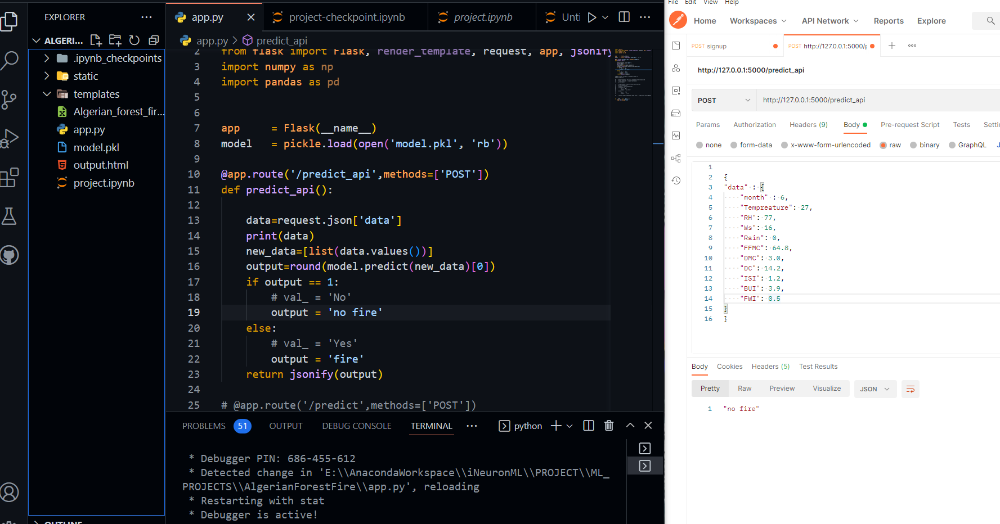

In [148]:
df_plot.head(5)

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
0,1,6,2012,29,57,18,0.0,65.7,3.4,7.6,1.3,3.4,0.5,not fire
1,2,6,2012,29,61,13,1.3,64.4,4.1,7.6,1.0,3.9,0.4,not fire
2,3,6,2012,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,not fire
3,4,6,2012,25,89,13,2.5,28.6,1.3,6.9,0.0,1.7,0.0,not fire
4,5,6,2012,27,77,16,0.0,64.8,3.0,14.2,1.2,3.9,0.5,not fire
